# XPCS&XSVS Pipeline for Single-(Gi)-SAXS Run
"This notebook corresponds to version {{ version }} of the pipeline tool: https://github.com/NSLS-II/pipelines"

This notebook begins with a raw time-series of images and ends with $g_2(t)$ for a range of $q$, fit to an exponential or stretched exponential, and a two-time correlation functoin.

## Overview

* Setup: load packages/setup path
* Load Metadata & Image Data
* Apply Mask
* Clean Data: shutter open/bad frames
* Get Q-Map
* Get 1D curve
* Define Q-ROI (qr, qz)
* Check beam damage
* One-time Correlation
* Fitting
* Two-time Correlation
The important scientific code is imported from the [chxanalys](https://github.com/yugangzhang/chxanalys/tree/master/chxanalys) and [scikit-beam](https://github.com/scikit-beam/scikit-beam) project. Refer to chxanalys and scikit-beam for additional documentation and citation information.

## CHX Olog NoteBook
CHX Olog (https://logbook.nsls2.bnl.gov/11-ID/)

## Setup

Import packages for I/O, visualization, and analysis.

In [4]:
from chxanalys.chx_packages import *
%matplotlib notebook
plt.rcParams.update({'figure.max_open_warning': 0})
plt.rcParams.update({ 'image.origin': 'lower'   })
plt.rcParams.update({ 'image.interpolation': 'none'   })

from os import listdir
from os.path import isfile, join
from PIL import Image

#%reset -f  #for clean up things in the memory

In [5]:
def get_pattern_filenames(filename_list, pattern):
    fns = []
    for fn in filename_list:
        if pattern in fn:
            fns.append( fn ) 
    return np.array( fns )

def show_one_sid( sid, mask, fps ):
    for fp in fps:
        #print(fp)
        if sid in fp:
            print(fp)
            break
        else:
            fp='0'
    im = Image.open( inDir + fp )
    img = np.array(im )[::-1]
    show_img( (img * mask  )[:400], logs=True, aspect= 1, cmap= cmap_albula, 
         image_name= fp[:-5], save=True,path=outDir)   
    
    
    

In [6]:
inDir = '/home/yuzhang/Data/Fang_CMS/March10/RawData/'
outDir = '/home/yuzhang/Data/Fang_CMS/March10/Image/'


inDir = '/home/yuzhang/Data/Fang_CMS/July14/RawData/'
outDir = '/home/yuzhang/Data/Fang_CMS/July14/Image/'


ResDir = '/home/yuzhang/Data/Fang_CMS/July14/Results/'

##New data (2017 July)
inDir = '/home/yuzhang/Data/Fang_CMS/July_Combined_newData/RawData/2017_Samples/'
ResDir = '/home/yuzhang/Data/Fang_CMS/July_Combined_newData/Results/'


## old data (2014 data)
#inDir = '/home/yuzhang/Data/Fang_CMS/July_Combined_newData/RawData/2014_Samples/'
#ResDir = '/home/yuzhang/Data/Fang_CMS/July_Combined_newData/Results/'



In [7]:
tifs = np.array( [f for f in listdir(inDir) if isfile(join(inDir, f))] )

In [8]:
tifs

array(['AgBH_5m_cali_5.00s_78455_saxs.tiff',
       'FL_July13_2017_707_10_0.10s_78484_saxs.tiff',
       'FL_July13_2017_707_10_0.20s_78485_saxs.tiff',
       'FL_July13_2017_707_10_0.20s_78486_saxs.tiff',
       'FL_July13_2017_707_10_0.20s_78487_saxs.tiff',
       'FL_July13_2017_707_1_0.10s_78458_saxs.tiff',
       'FL_July13_2017_707_1_0.10s_78459_saxs.tiff',
       'FL_July13_2017_707_1_0.10s_78460_saxs.tiff',
       'FL_July13_2017_707_1_0.10s_78461_saxs.tiff',
       'FL_July13_2017_707_1_0.10s_78462_saxs.tiff',
       'FL_July13_2017_707_1_0.10s_78463_saxs.tiff',
       'FL_July13_2017_707_1_0.10s_78464_saxs.tiff',
       'FL_July13_2017_707_1_0.10s_78465_saxs.tiff',
       'FL_July13_2017_707_1_0.10s_78466_saxs.tiff',
       'FL_July13_2017_707_11_0.10s_78488_saxs.tiff',
       'FL_July13_2017_707_11_0.10s_78489_saxs.tiff',
       'FL_July13_2017_707_11_0.10s_78490_saxs.tiff',
       'FL_July13_2017_707_11_0.10s_78491_saxs.tiff',
       'FL_July13_2017_707_11_0.10s_78492_saxs

## check one image

In [95]:
fp = 'FL_July13_2017_707_3_0.10s_78474_saxs.tiff'
fp = 'FL_July14_2017_707_4_T69.997C_2.00s_78872_saxs.tiff'
fp = 'FL_July14_2017_707_4_T70.003C_1.00s_78868_saxs.tiff'

#fp = 'FL_July13_2017_707_1_0.10s_78458_saxs.tiff'
#fp = 'AgBH_5m_cali_5.00s_78455_saxs.tiff'

im = Image.open( inDir + fp )
img = np.array(im )[::-1]

In [96]:
fp[-15:-10]

'78868'

<IPython.core.display.Javascript object>


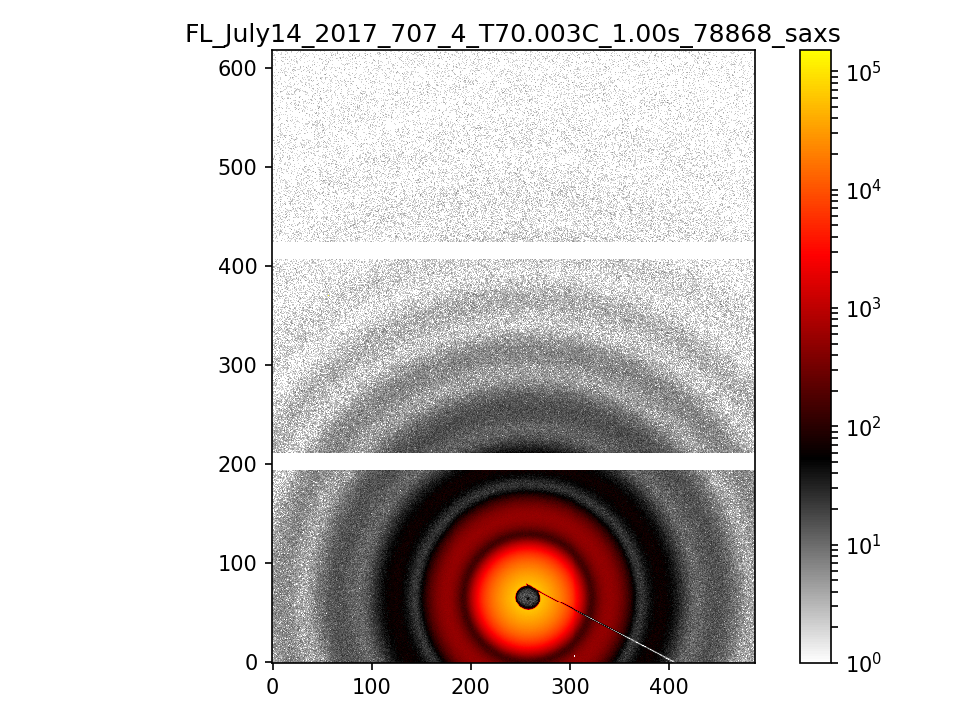

In [97]:
show_img( img, logs=True, aspect= 1, cmap= cmap_albula, 
         image_name= fp[:-5], save=True,path=outDir)

<IPython.core.display.Javascript object>


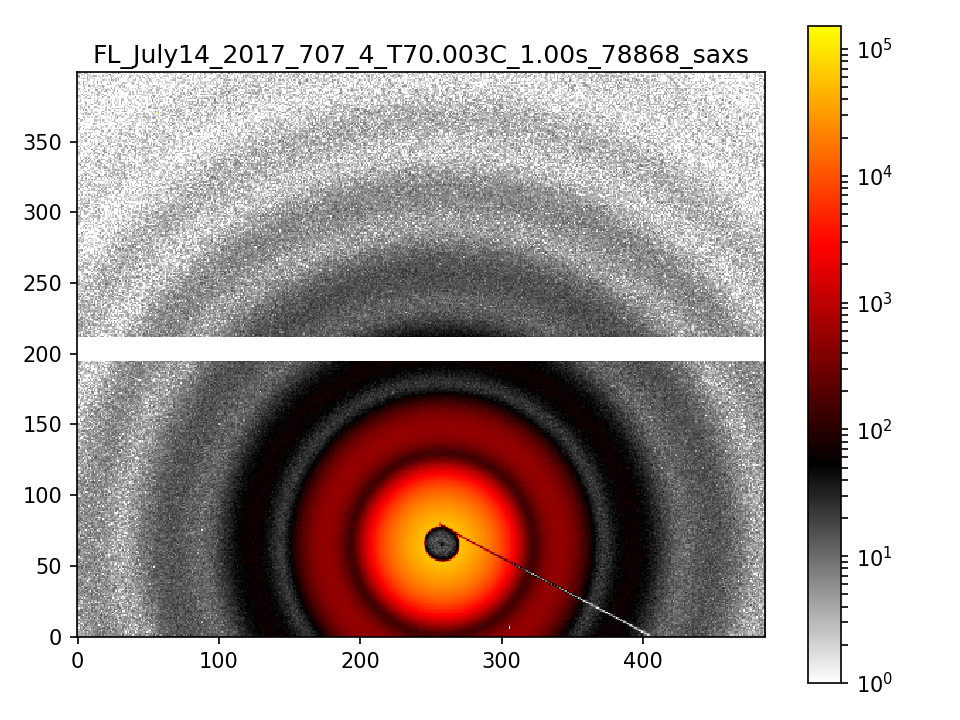

In [98]:
show_img( img[:400], logs=True, aspect= 1, cmap= cmap_albula, 
         image_name= fp[:-5], save=True,path=outDir)

# Create a mask for L70s

In [25]:
%run chxanalys_link/chxanalys/chx_generic_functions.py

In [81]:
center = [    258, 65 ]

In [82]:
mask_vline = create_multi_rotated_rectangle_mask(  img, center= center, length=600, width=5, 
                                        angles=[0, 180 ])

In [83]:
mask_incline = create_multi_rotated_rectangle_mask(  img, center= [275,66], length= 600, width= 5, 
                                        angles=[ 117 ] )

In [84]:
mask_cen = create_cross_mask(  img, center=center,
                            wy_left= 0, wy_right= 0, 
                              wx_up= 0, wx_down= 0,center_radius= 20 )

In [85]:
mask_chip = create_cross_mask(  img, center= [0,203],
                            wy_left= 0, wy_right= 10, 
                              wx_up= 0, wx_down= 0,center_radius= 0 )

mask_chip *= create_cross_mask(  img, center= [0,416],
                            wy_left= 0, wy_right= 10, 
                              wx_up= 0, wx_down= 0,center_radius= 0 )

In [86]:
hmask = create_hot_pixel_mask( img, threshold = 5e4, center=center, center_radius= 100)

In [87]:
mask_com = mask_incline * mask_cen * mask_chip * hmask
mask = mask_com * mask_vline 

In [88]:
mask_com = np.load( ResDir + 'mask_com.npy')

In [92]:
#show_img(mask_com)

<IPython.core.display.Javascript object>


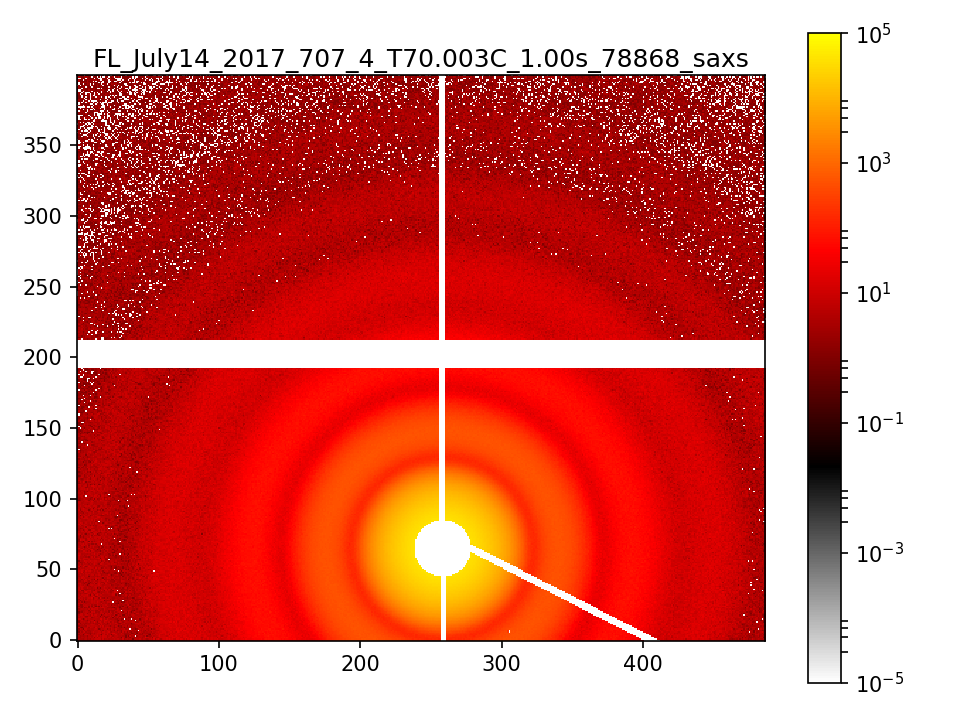

In [99]:
show_img( (img * mask  )[:400], logs=True, aspect= 1, cmap= cmap_albula, 
         image_name= fp[:-5], save=True,path=outDir, vmin=1e-5, vmax=1e5)

# Setup Diffraction parameters

In [34]:
#enter = [    258, 65 ]
center = [     65,258 ]
inc_x0 =  center[1]
inc_y0=   center[0]

Ldet = 5.038 *1000
lambda_ = 0.9184
dpix = 172 *10**(-3)

exposuretime = 0.1
timeperframe = 0.1
data_dir = '/home/yuzhang/Data/Fang_CMS/July14/OneD/' 
uid = 'sid=%s'%fp[15:-10]

setup_pargs=dict(uid=uid, dpix= dpix, Ldet=Ldet, lambda_= lambda_, exposuretime=exposuretime,
        timeperframe=timeperframe, center=center, path= ResDir)

print_dict( setup_pargs )

timeperframe--> 0.1
exposuretime--> 0.1
path--> /home/yuzhang/Data/Fang_CMS/July_Combined_newData/Results/
uid--> sid=707_3_0.10s_78474
Ldet--> 5038.0
center--> [65, 258]
lambda_--> 0.9184
dpix--> 0.17200000000000001


# check images

In [35]:
fpattern = '707_1_'
fpattern = '707_2_'
fpattern = '707_3_'
fpattern = '710_1_'
fpattern = '713_1_'




In [36]:
fps = get_pattern_filenames(  tifs, '70R420_')
print(fps)

[]


In [37]:
bad_fps = ['FL_July13_2017_707_1_0.10s_78456_saxs.tiff',
            'FL_July13_2017_707_1_0.10s_78457_saxs.tiff'
           'FL_July13_2017_707_2_0.10s_78472_saxs.tiff',
         'FL_July13_2017_707_2_0.10s_78473_saxs.tiff',
            'FL_July14_2017_707_3_0.20s_78809_saxs.tiff',
     'FL_July14_2017_707_3_0.20s_78810_saxs.tiff',
     'FL_July14_2017_707_3_0.20s_78811_saxs.tiff',
     'FL_July14_2017_707_3_0.20s_78812_saxs.tiff',
           
          
          ]

In [38]:
#fps

In [39]:
#mask_474 = mask.copy()
#np.save(ResDir + 'mask_com', mask_com)
#np.save(ResDir + 'mask_474', mask_474)
#np.save(ResDir + 'mask_477', mask_477)
#np.save(ResDir + 'mask_480', mask_480)
#np.save(ResDir + 'mask_815', mask_815)
#np.save(ResDir + 'mask_817', mask_817)
#np.save(ResDir + 'mask_387', mask_387)

In [40]:
mask_dict = {'mask_com': mask_com, '78474': mask_474, '78475': mask_474, '78477': mask_477, 
            '78480': mask_480, '78483': mask_480, '78814': mask_480,'78815': mask_815,
            '78816': mask_815,'78817': mask_817,   
            '79387': mask_387, '79388': mask_387, '79389': mask_387, '79390': mask_387, '79391': mask_387,
             
            
            }

NameError: name 'mask_474' is not defined

In [601]:
center

[65, 258]

In [56]:
fps

array(['FL_July13_2017_707_4_0.10s_78499_saxs.tiff',
       'FL_July13_2017_707_4_0.10s_78500_saxs.tiff',
       'FL_July14_2017_707_4_T69.985C_0.10s_78864_saxs.tiff',
       'FL_July14_2017_707_4_T69.986C_10.00s_78879_saxs.tiff',
       'FL_July14_2017_707_4_T69.991C_5.00s_78874_saxs.tiff',
       'FL_July14_2017_707_4_T69.994C_5.00s_78878_saxs.tiff',
       'FL_July14_2017_707_4_T69.996C_0.10s_78863_saxs.tiff',
       'FL_July14_2017_707_4_T69.997C_2.00s_78872_saxs.tiff',
       'FL_July14_2017_707_4_T69.998C_5.00s_78875_saxs.tiff',
       'FL_July14_2017_707_4_T69.999C_0.10s_78865_saxs.tiff',
       'FL_July14_2017_707_4_T69.999C_1.00s_78867_saxs.tiff',
       'FL_July14_2017_707_4_T70.002C_0.10s_78866_saxs.tiff',
       'FL_July14_2017_707_4_T70.003C_1.00s_78868_saxs.tiff',
       'FL_July14_2017_707_4_T70.003C_1.00s_78870_saxs.tiff',
       'FL_July14_2017_707_4_T70.004C_5.00s_78873_saxs.tiff',
       'FL_July14_2017_707_4_T70.005C_1.00s_78871_saxs.tiff',
       'FL_July14_2017_70

In [57]:
def show_multi_sids( fps, mask ):
    for fp in fps:
        print(fp)
        im = Image.open( inDir + fp )
        img = np.array(im )[::-1]
        show_img( (img * mask  )[:400], logs=True, aspect= 1, cmap= cmap_albula, 
             image_name= fp[:-5], save=True,path=outDir)   


In [820]:
ang = 0
mask_vline = create_multi_rotated_rectangle_mask(  img, center= center[::-1], length=600, width=5, 
                                        angles=[  180 +ang ,    ang ])
m = mask_com * mask_vline
mask_ = m.copy()

In [832]:
#sids = [  '79509' ] + ['795%s'%i for i in range(10,17)]
#print(sids)

<IPython.core.display.Javascript object>


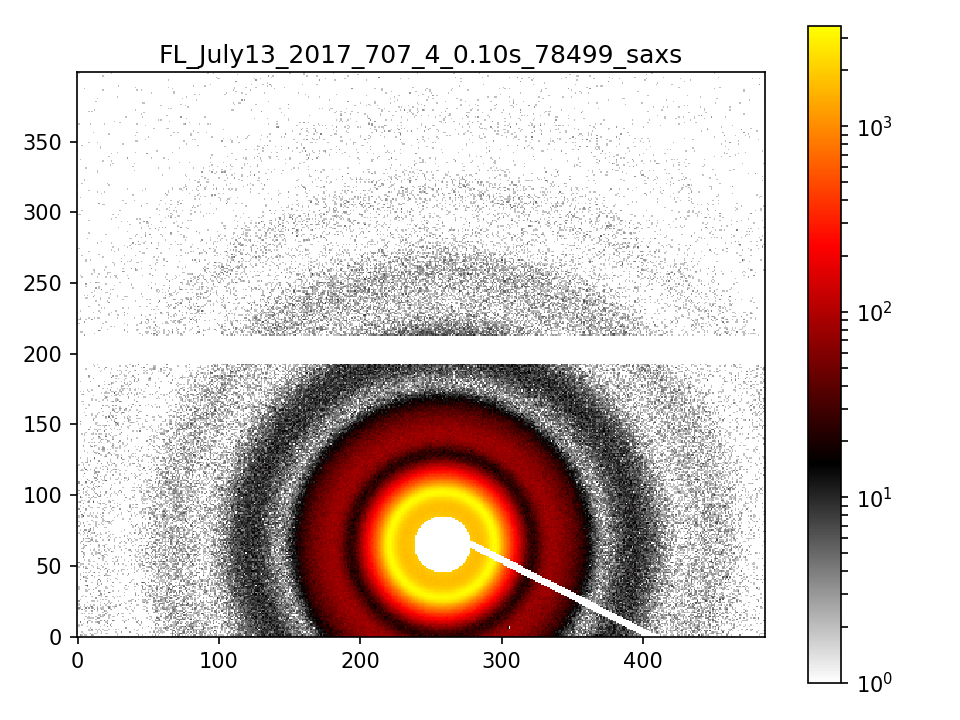

<IPython.core.display.Javascript object>


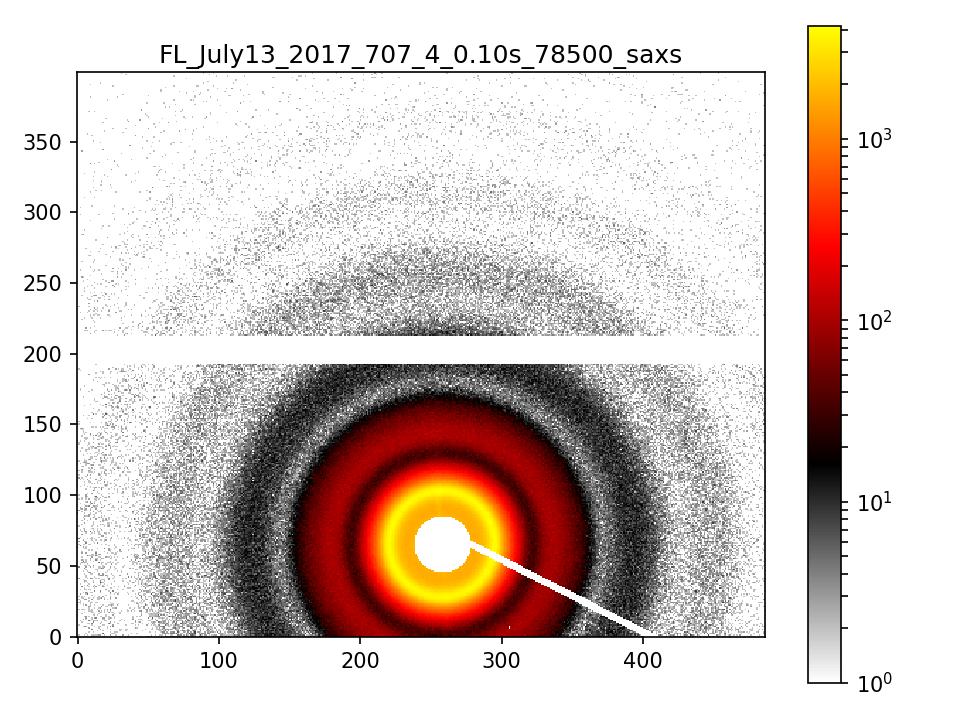

<IPython.core.display.Javascript object>


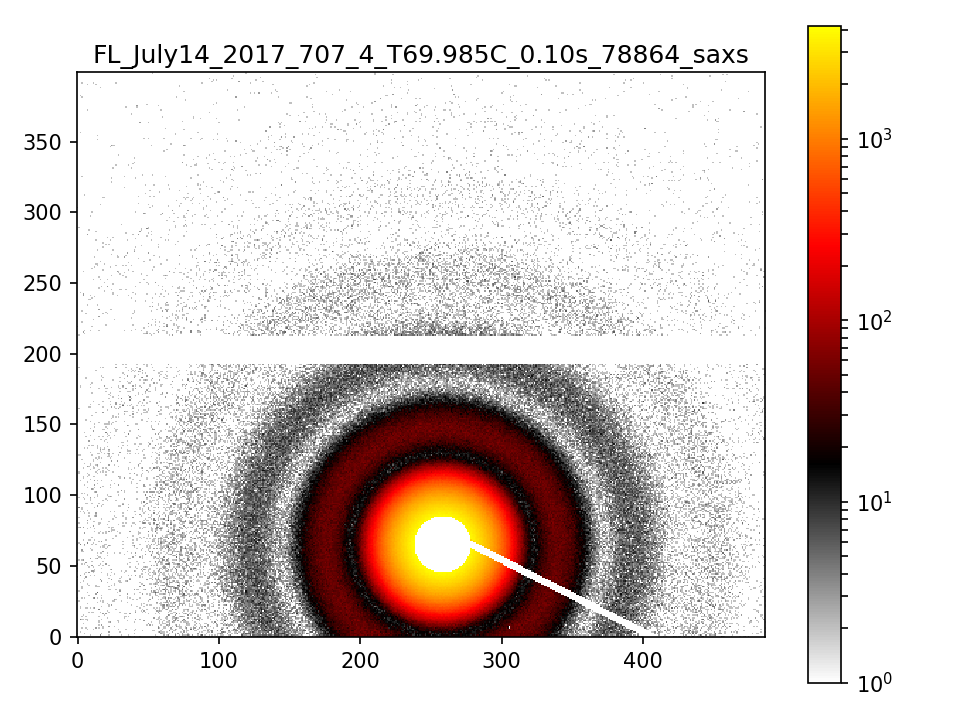

<IPython.core.display.Javascript object>


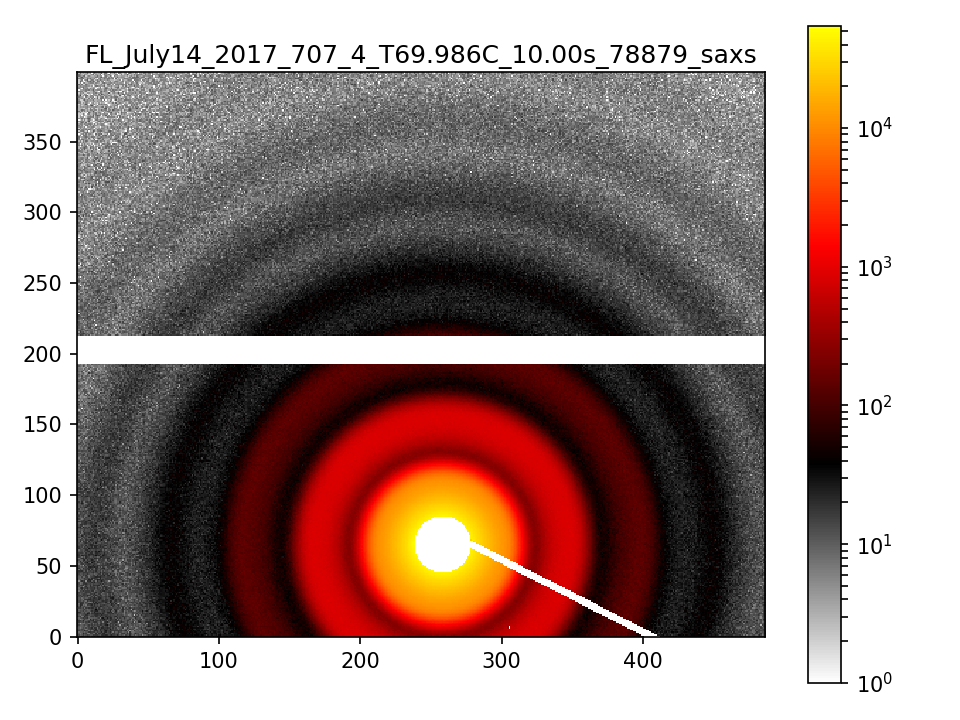

<IPython.core.display.Javascript object>


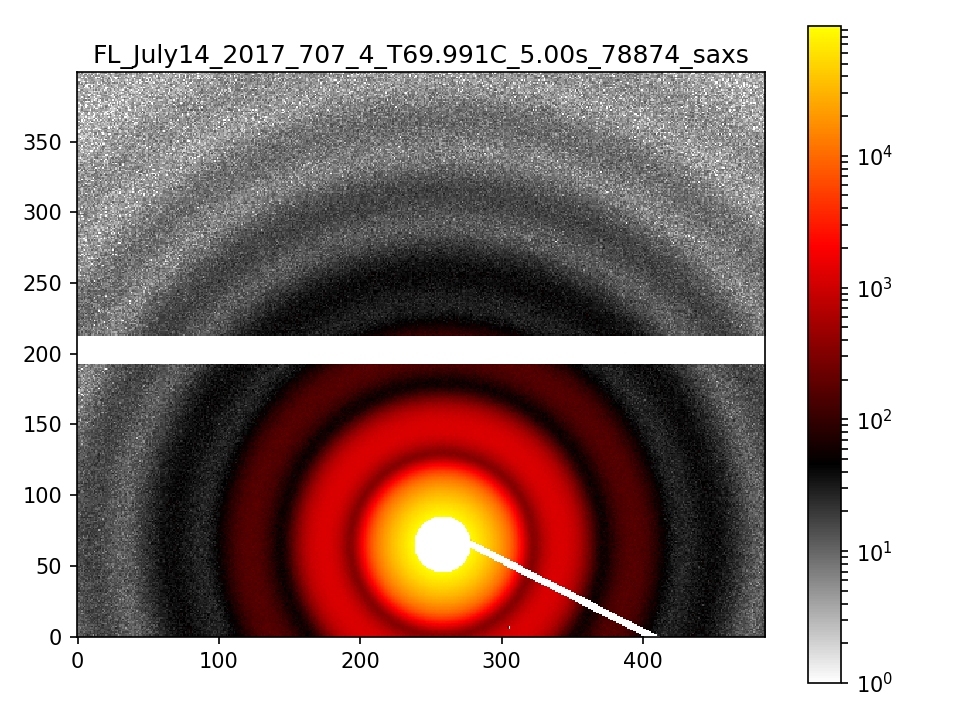

<IPython.core.display.Javascript object>


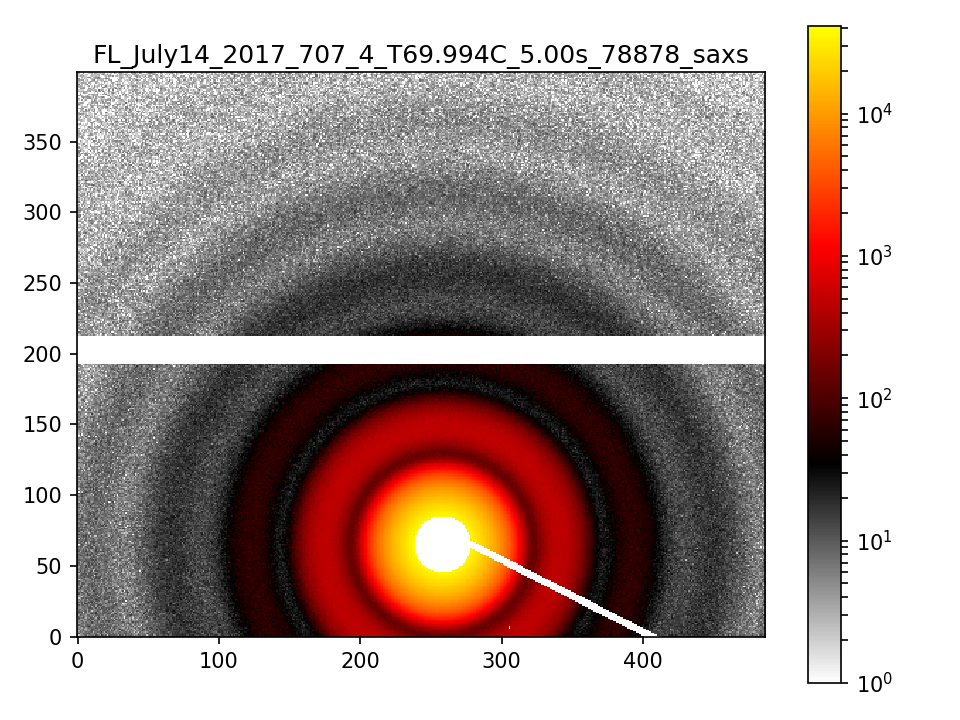

<IPython.core.display.Javascript object>


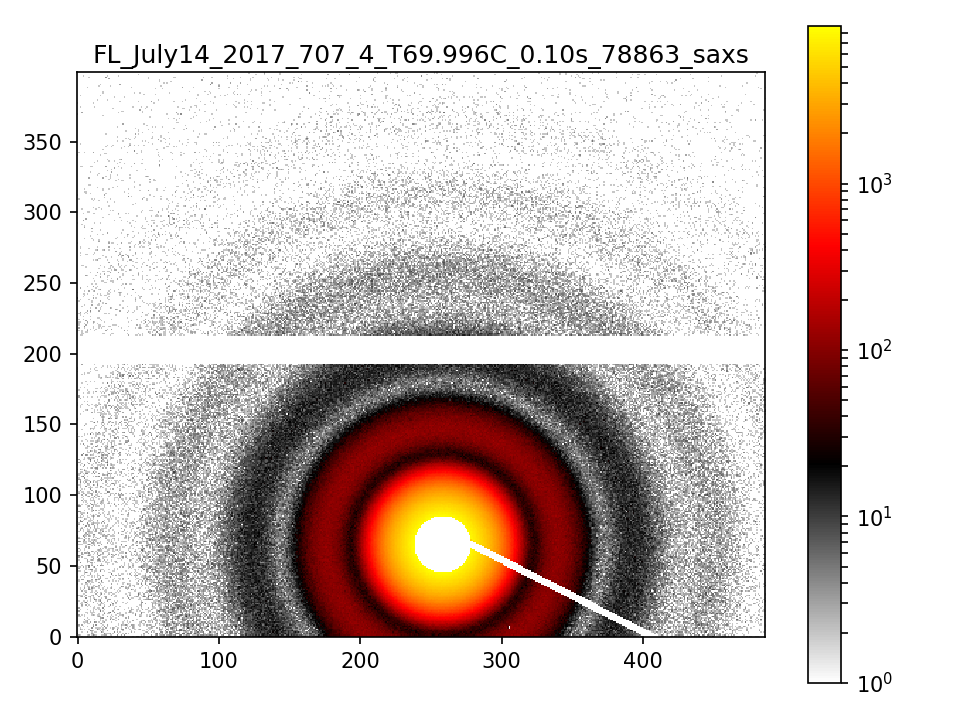

<IPython.core.display.Javascript object>


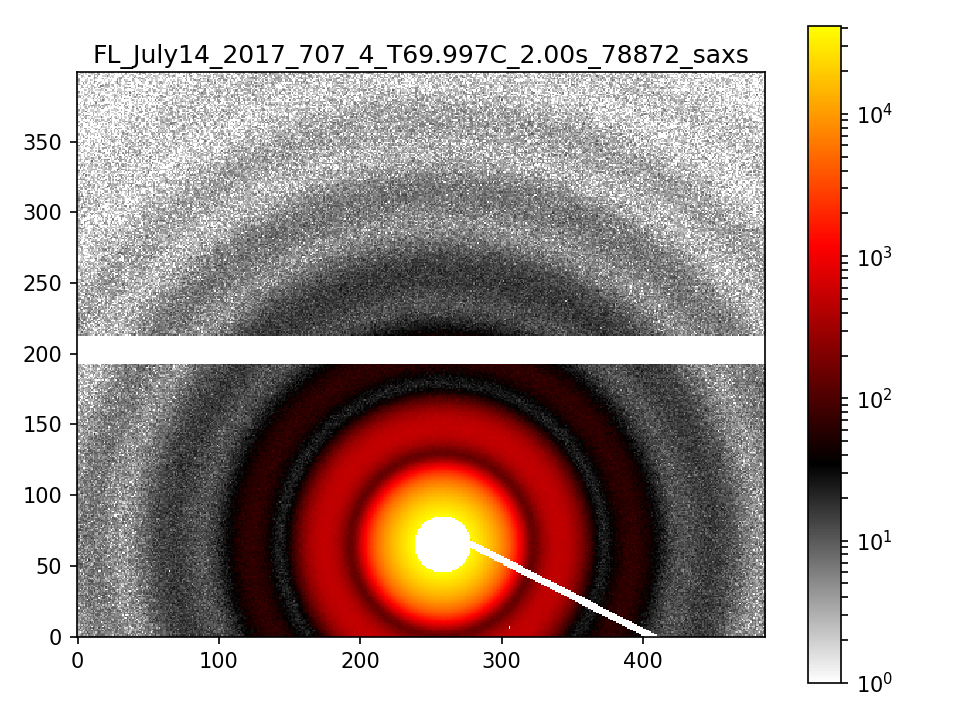

<IPython.core.display.Javascript object>


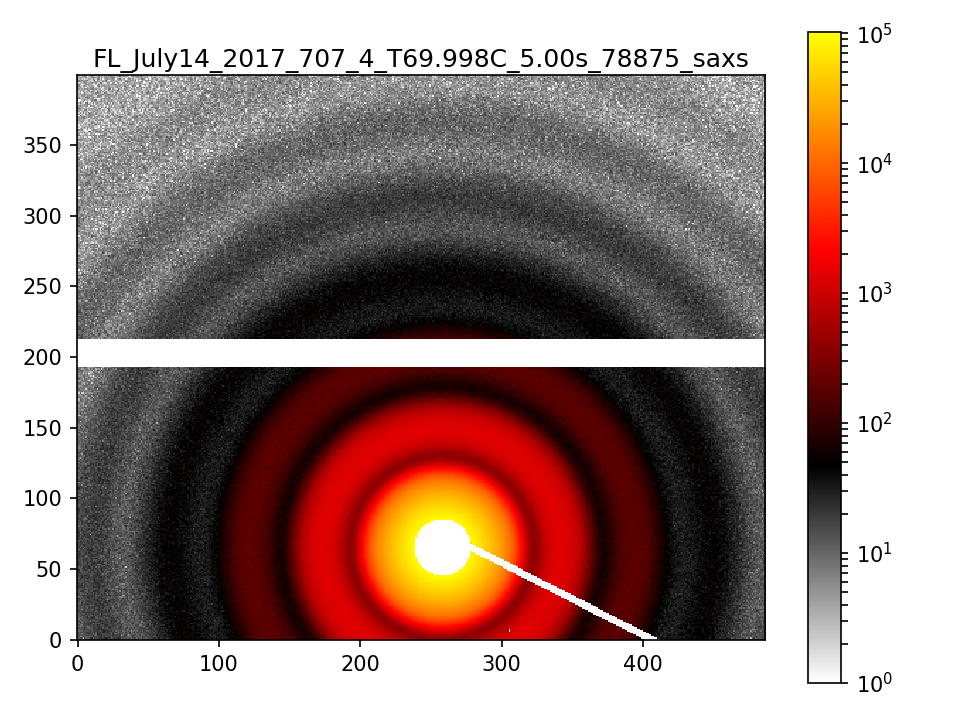

<IPython.core.display.Javascript object>


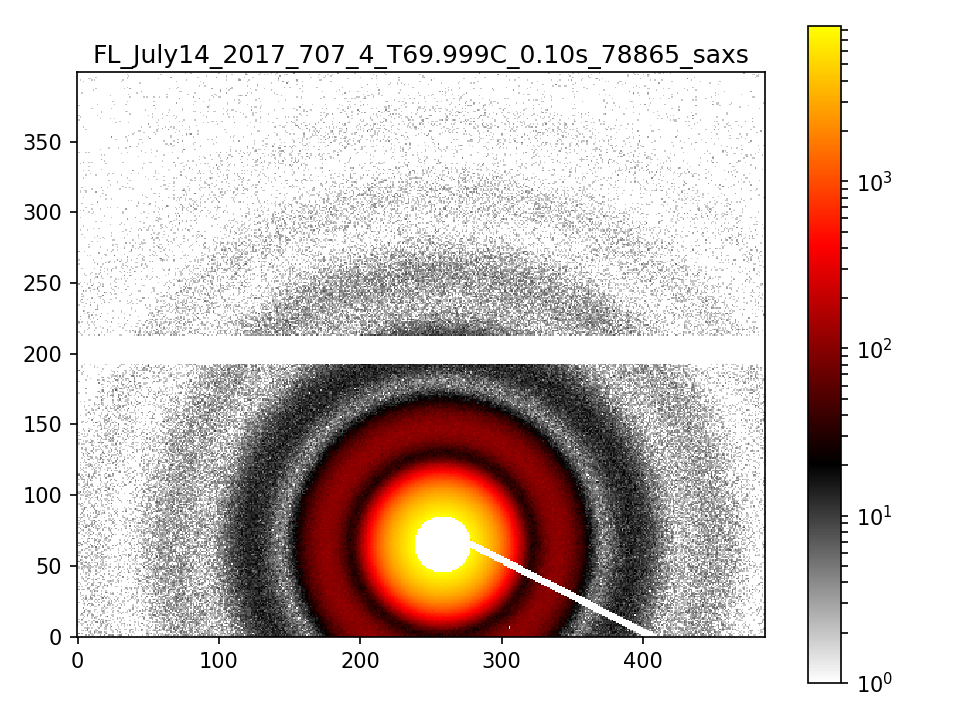

<IPython.core.display.Javascript object>


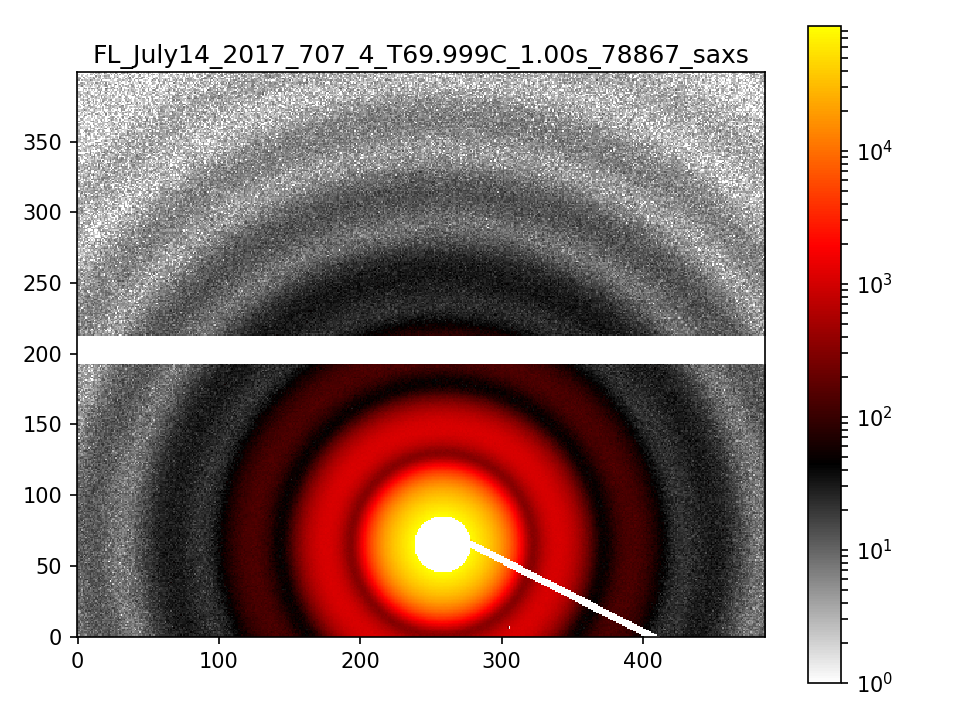

<IPython.core.display.Javascript object>


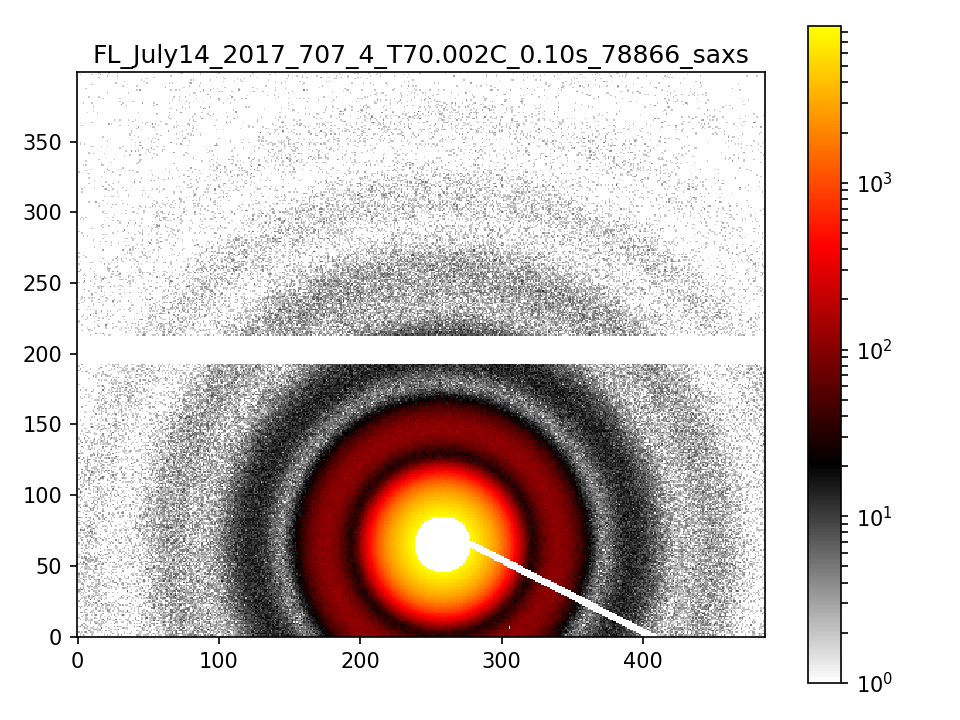

<IPython.core.display.Javascript object>


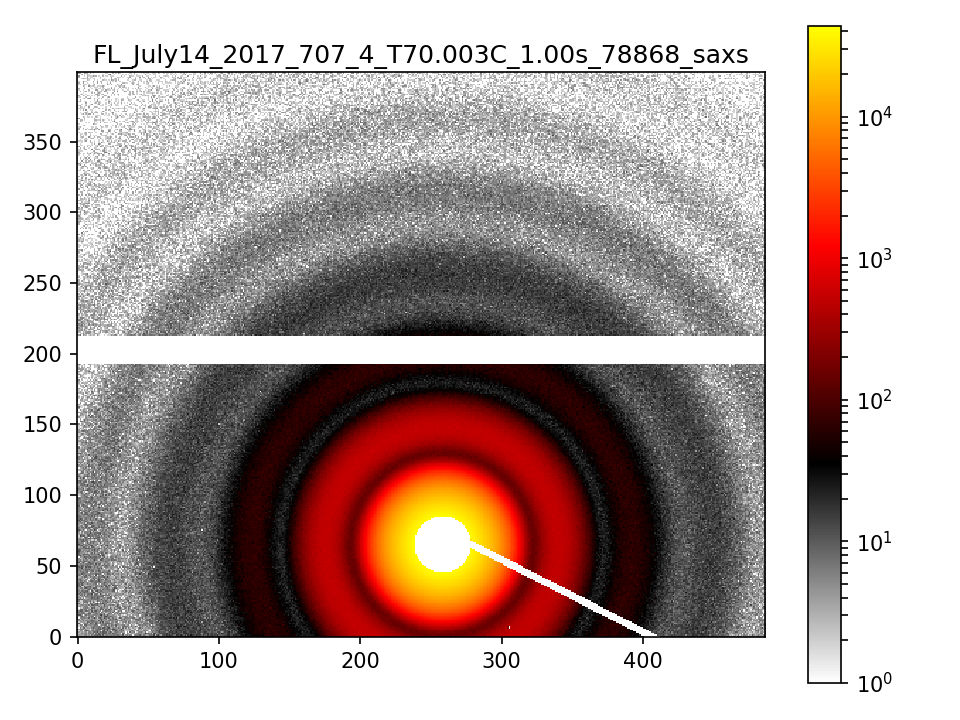

<IPython.core.display.Javascript object>


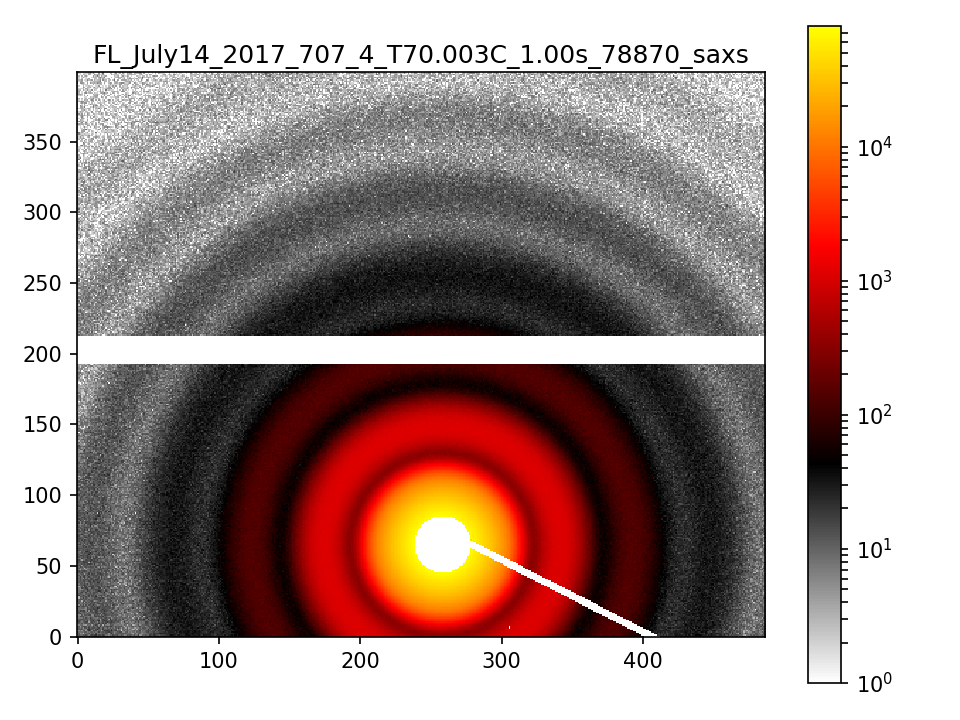

<IPython.core.display.Javascript object>


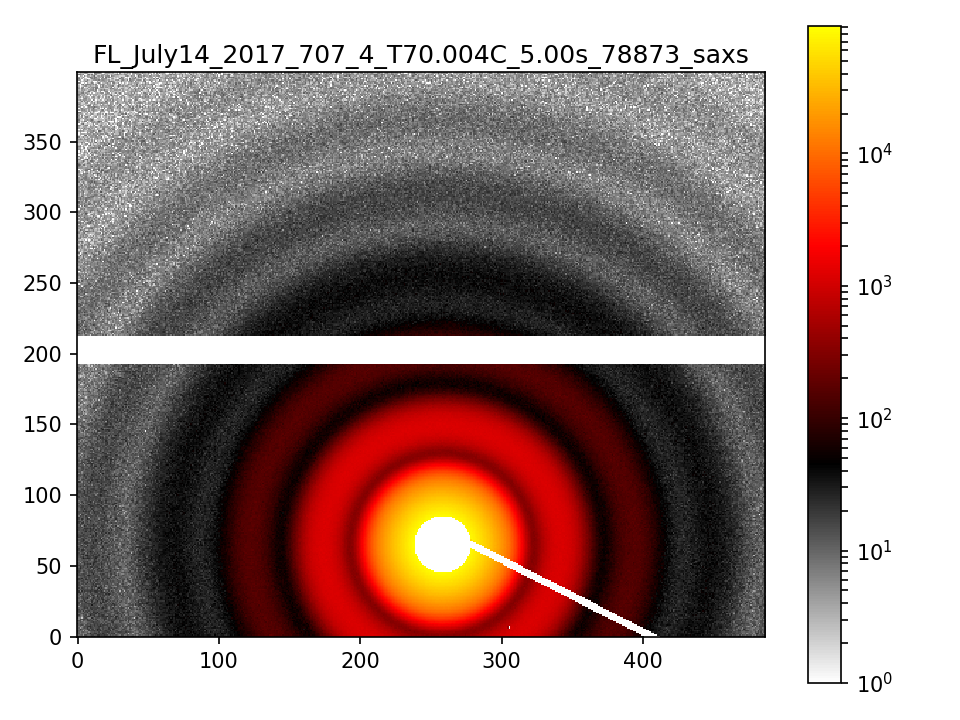

<IPython.core.display.Javascript object>


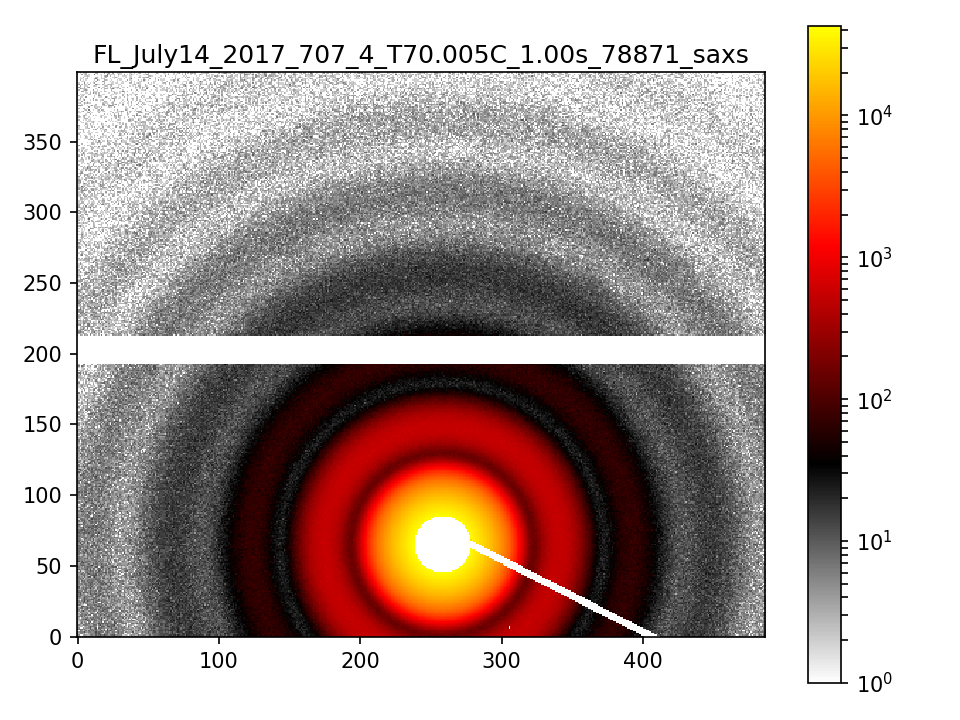

<IPython.core.display.Javascript object>


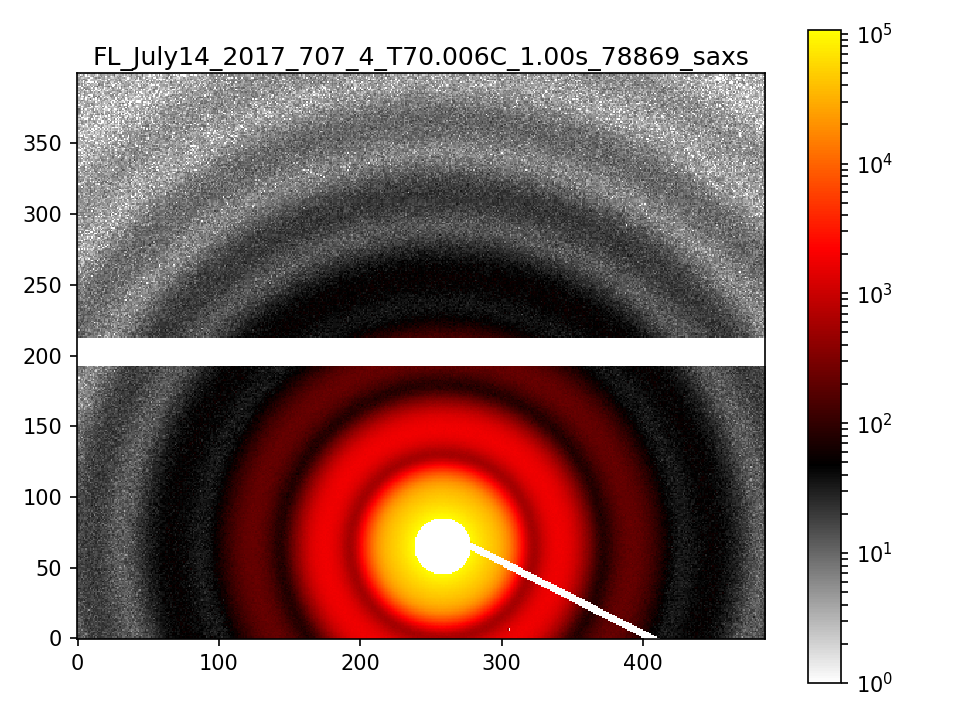

<IPython.core.display.Javascript object>


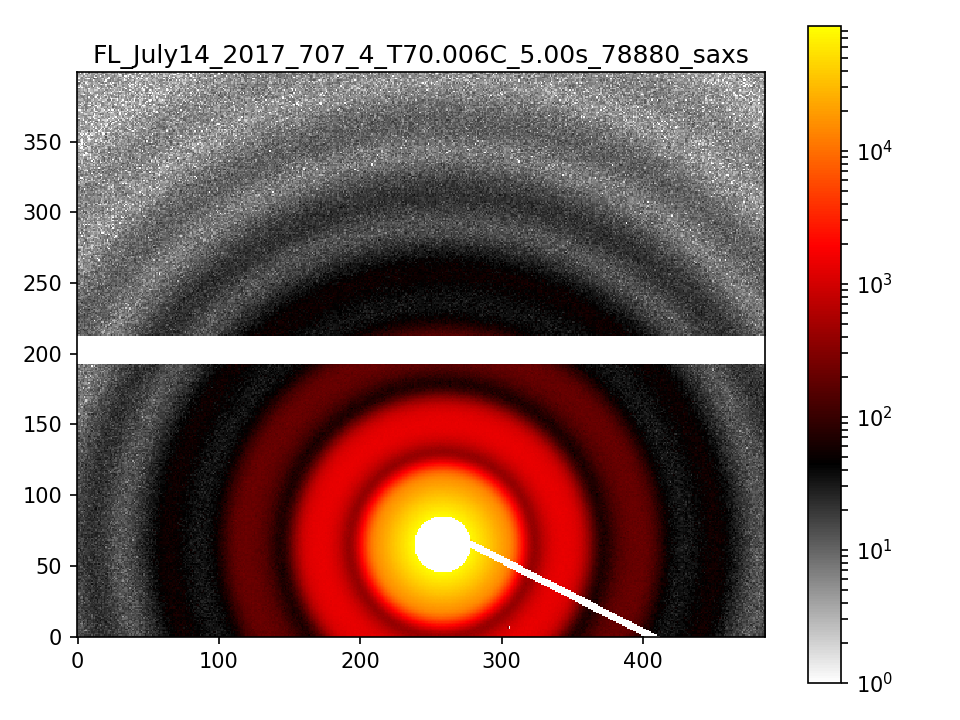

<IPython.core.display.Javascript object>


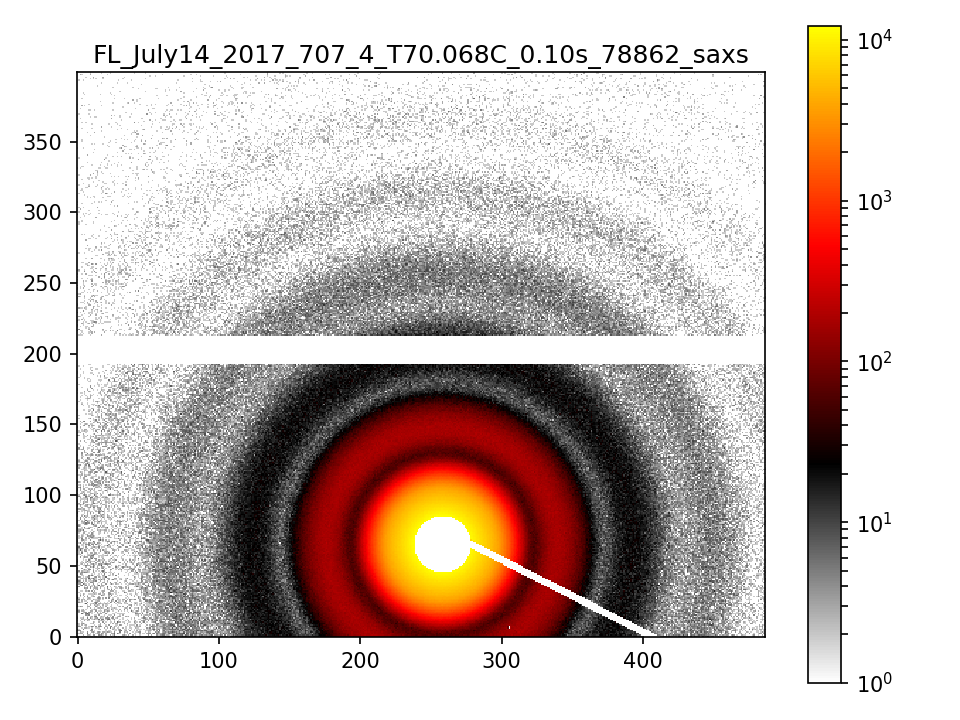

<IPython.core.display.Javascript object>


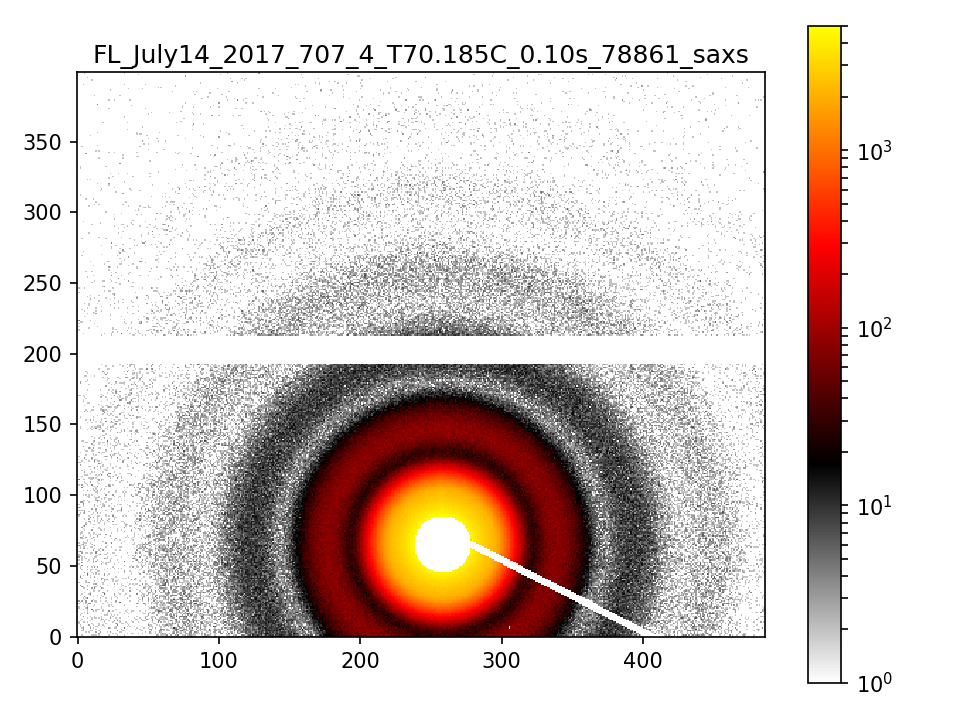

<IPython.core.display.Javascript object>


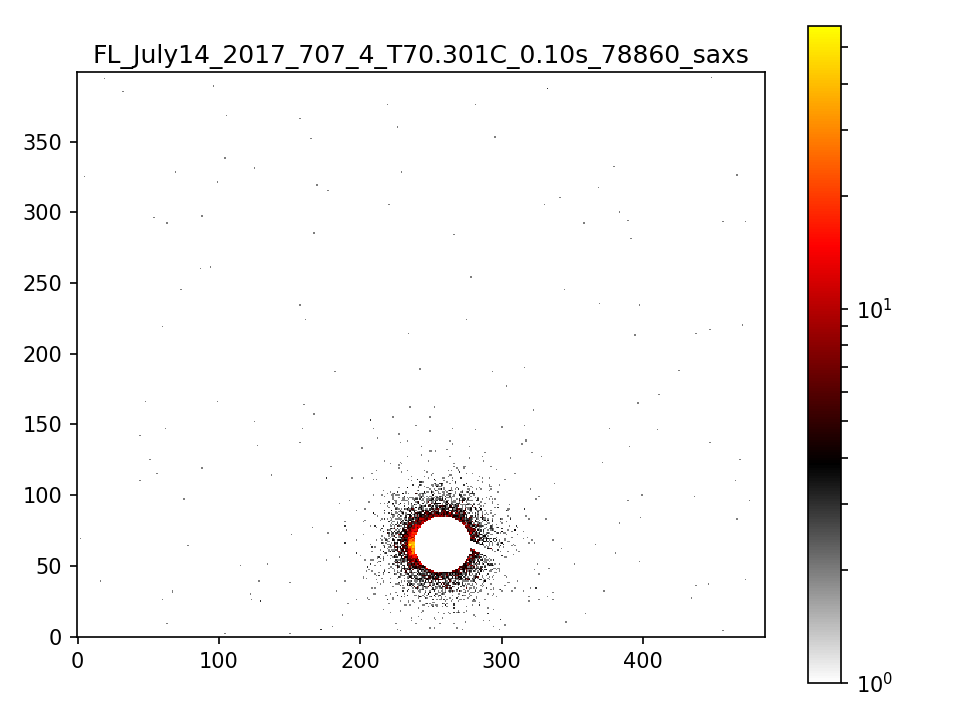

<IPython.core.display.Javascript object>


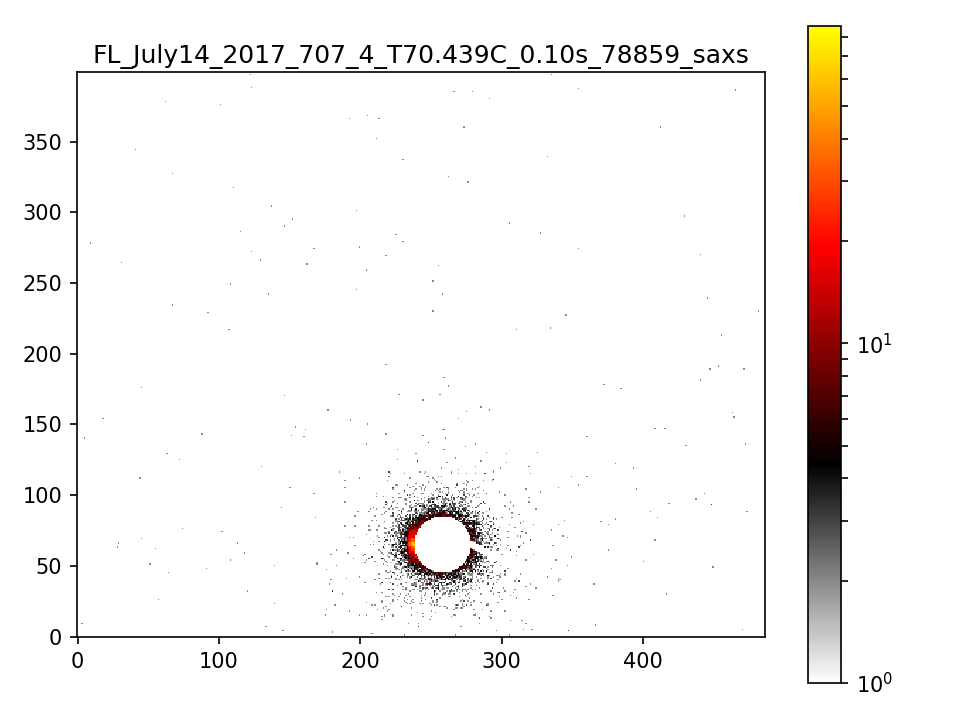

In [100]:
#show_one_sid( '79509', mask_com, fps)
show_multi_sids( fps, mask_com)

# Get Q-Iq

In [792]:
mask_dict = {'mask_com': mask_com, '78474': mask_474, '78475': mask_474, '78477': mask_477, 
            '78480': mask_480, '78483': mask_480, '78814': mask_480,'78815': mask_815,
            '78816': mask_815,'78817': mask_817,   
            '79387': mask_387, '79388': mask_387, '79389': mask_387, '79390': mask_387, '79391': mask_387,
             
            
            }

In [101]:
mask_dict= {'mask_com': mask_com,}

In [707]:
len(tifs), len(bad_fps)

(104, 7)

In [803]:
fpatterns = {
            'Cube_L70_July2017': ['707_1_', '707_2_','707_3_', '710_1_', '713_1_'], #L70
            'Sphere_L70_July2017': ['707_10_', '707_11_', '707_12_', '710_2_'], #sphere, L70
             'Cube_L120_July2017': ['710_3_', '710_5_','710_6_', '713_3_', '710_7_'], #L120
             'Cube_L160_July2017': ['710_4_', '710_8_','710_9_', '710_10_'], #L160
            }
 


In [839]:
fpatterns = {
            'Cube_L70_July2014': ['70R210_', '70R420_','829_2_'], #L70
 
            }
 

In [102]:
fpatterns = {
            'Cube_L70_July2017': ['707_4_'], #L70 for form factor
}

In [103]:
fps = get_pattern_filenames(  tifs, '707_4_')
print(fps)

['FL_July13_2017_707_4_0.10s_78499_saxs.tiff'
 'FL_July13_2017_707_4_0.10s_78500_saxs.tiff'
 'FL_July14_2017_707_4_T69.985C_0.10s_78864_saxs.tiff'
 'FL_July14_2017_707_4_T69.986C_10.00s_78879_saxs.tiff'
 'FL_July14_2017_707_4_T69.991C_5.00s_78874_saxs.tiff'
 'FL_July14_2017_707_4_T69.994C_5.00s_78878_saxs.tiff'
 'FL_July14_2017_707_4_T69.996C_0.10s_78863_saxs.tiff'
 'FL_July14_2017_707_4_T69.997C_2.00s_78872_saxs.tiff'
 'FL_July14_2017_707_4_T69.998C_5.00s_78875_saxs.tiff'
 'FL_July14_2017_707_4_T69.999C_0.10s_78865_saxs.tiff'
 'FL_July14_2017_707_4_T69.999C_1.00s_78867_saxs.tiff'
 'FL_July14_2017_707_4_T70.002C_0.10s_78866_saxs.tiff'
 'FL_July14_2017_707_4_T70.003C_1.00s_78868_saxs.tiff'
 'FL_July14_2017_707_4_T70.003C_1.00s_78870_saxs.tiff'
 'FL_July14_2017_707_4_T70.004C_5.00s_78873_saxs.tiff'
 'FL_July14_2017_707_4_T70.005C_1.00s_78871_saxs.tiff'
 'FL_July14_2017_707_4_T70.006C_1.00s_78869_saxs.tiff'
 'FL_July14_2017_707_4_T70.006C_5.00s_78880_saxs.tiff'
 'FL_July14_2017_707_4_T70.

In [44]:
setup_pargs

{'Ldet': 5038.0,
 'center': [65, 258],
 'dpix': 0.17200000000000001,
 'exposuretime': 0.1,
 'lambda_': 0.9184,
 'path': '/home/yuzhang/Data/Fang_CMS/July_Combined_newData/Results/',
 'timeperframe': 0.1,
 'uid': 'sid=707_3_0.10s_78474'}

### Get q_iq

In [842]:
len(q)

590

In [802]:
#fpatterns = {'Cube_L70_July2017': ['707_1_']}

In [786]:
#save_lists??

In [104]:
mask_dict= {'mask_com': mask_com,}

In [105]:
for sample in list(fpatterns.keys()):#each sample have different measurements, i.e., file patterns
    files = fpatterns[sample]
    print(sample)
    for fpattern in files:#each pattern have multi files
        #print(fpattern)
        fps = get_pattern_filenames(  tifs, fpattern)# to get multi files for each pattern
        N = len(fps) +1
        
        label_fps = np.zeros([   N ] , dtype=object)
        label_fps[0] = 'q'
        
        for i, fp in enumerate(fps):#for each file to get q_iq
            sid = fp[-15:-10]
            setup_pargs['uid'] = 'sid=%s'%sid
            #print(sid)
            mask= 'dummy'
            label_fps[i+1] =  str(sid)
            
            try:
                mask = mask_dict[sid]
                #print('Use a special mask here for sid=%s'%sid)
            except:
                mask= mask_dict['mask_com']
            im = Image.open( inDir + fp )
            img = np.array(im )[::-1]         
            qp, iq, q = get_circular_average( img, mask , pargs=setup_pargs,save=True  )
            if i==0:
                data_fps = np.zeros([ len(q), N ])
                data_fps[:,i] = q
            data_fps[:,i+1] = iq
        pd = save_arrays( data_fps, label=label_fps, dtype='array', filename= sample + '_' + fpattern + 'qIq.csv', 
                        path= ResDir, return_res=True)
            
            
            

Cube_L70_July2017
The file: Cube_L70_July2017_707_4_qIq.csv is saved in /home/yuzhang/Data/Fang_CMS/July_Combined_newData/Results/


In [845]:
import pandas as pds

In [849]:
PQ = pds.read_csv( ResDir + 'Cube_L70_July2014_829_2_qIq.csv')
L70_R210 = pds.read_csv( ResDir + 'Cube_L70_July2014_70R210_qIq.csv')
L70_R420 = pds.read_csv( ResDir + 'Cube_L70_July2014_70R420_qIq.csv')

In [542]:
fp = 'FL_July14_2017_707_4_T69.997C_2.00s_78872_saxs.tiff'

setup_pargs['uid'] = 'sid=%s'%fp[-15:-10]
im = Image.open( inDir + fp )
img = np.array(im )[::-1] 
qp, pq, q = get_circular_average( img, mask , pargs=setup_pargs,save=True  )

In [544]:
save_arrays( [q,pq], label=['q','Pq'], dtype='list', filename= 'PQ_' + setup_pargs['uid'] + '.csv', 
            path= ResDir, return_res=False)

The file: PQ_sid=78872.csv is saved in /home/yuzhang/Data/Fang_CMS/July14/Results/


<IPython.core.display.Javascript object>


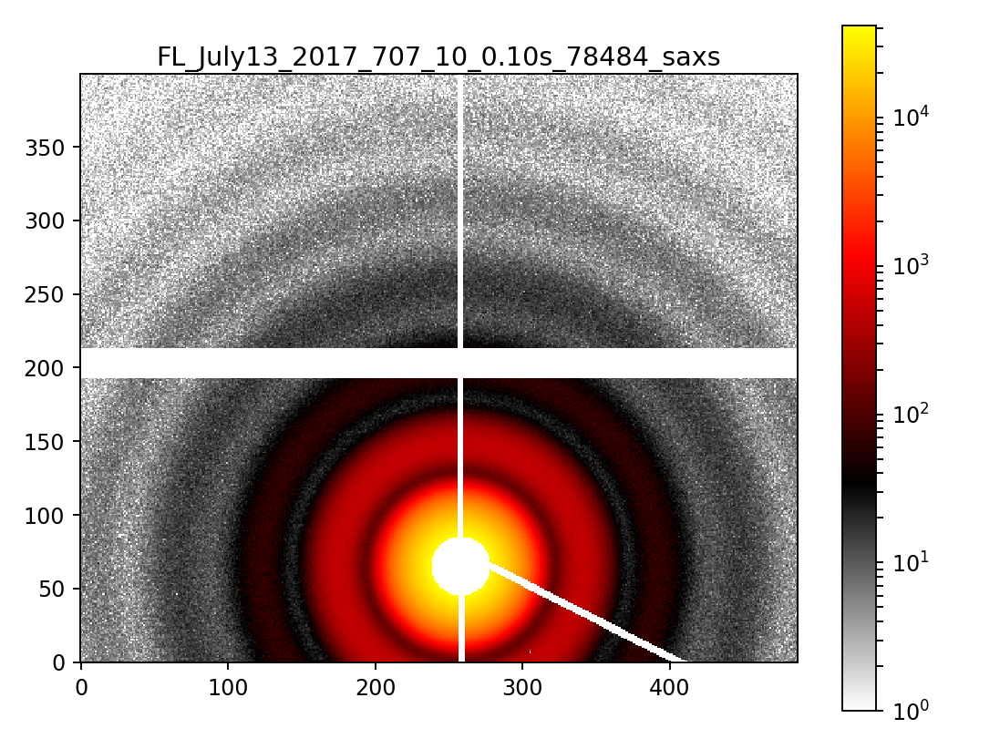

In [545]:
show_img( (img * mask  )[:400], logs=True, aspect= 1, cmap= cmap_albula, 
         image_name= tifs[0][:-5], save=True,path=ResDir)

<IPython.core.display.Javascript object>


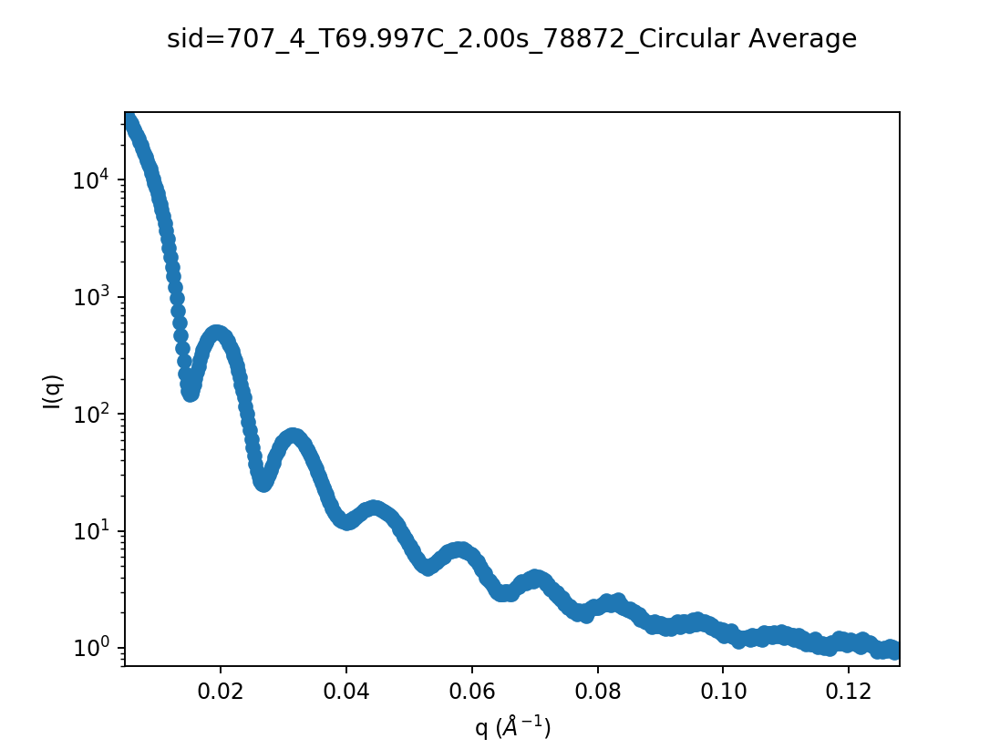

In [547]:
plot_circular_average( qp, pq, q ,  pargs=setup_pargs, 
                      xlim=[q.min(), q.max()*0.9], ylim = [pq.min(), pq.max()],save=True )

In [526]:
fp = 'FL_July13_2017_707_3_0.10s_78474_saxs.tiff'
fp = 'FL_July13_2017_707_1_0.10s_78458_saxs.tiff'


setup_pargs['uid'] = 'sid=%s'%fp[-15:-10]
im = Image.open( inDir + fp )
img = np.array(im )[::-1]

<IPython.core.display.Javascript object>


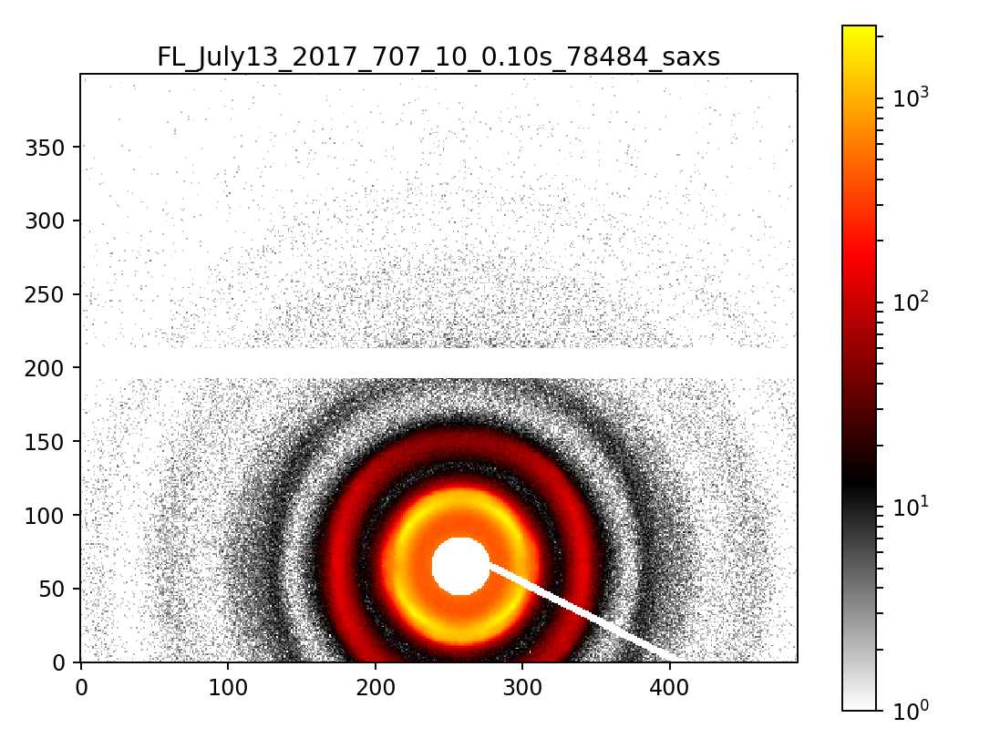

In [530]:
show_img( (img * mask_com  )[:400], logs=True, aspect= 1, cmap= cmap_albula, 
         image_name= tifs[0][:-5], save=True,path=outDir)

In [531]:
qp, iq, q = get_circular_average( img, mask , pargs=setup_pargs,save=True,  )


<IPython.core.display.Javascript object>


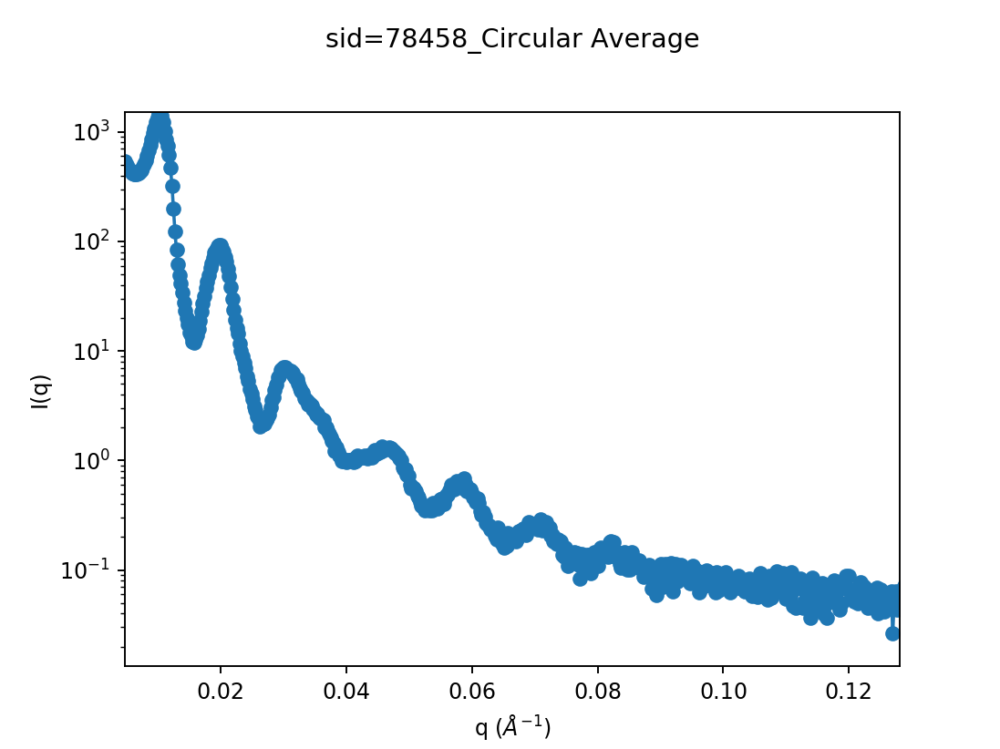

In [532]:
plot_circular_average( qp, iq, q ,  pargs=setup_pargs, save=True,
                      xlim=[q.min(), q.max()*0.9], ylim = [iq.min(), iq.max()] )

<IPython.core.display.Javascript object>


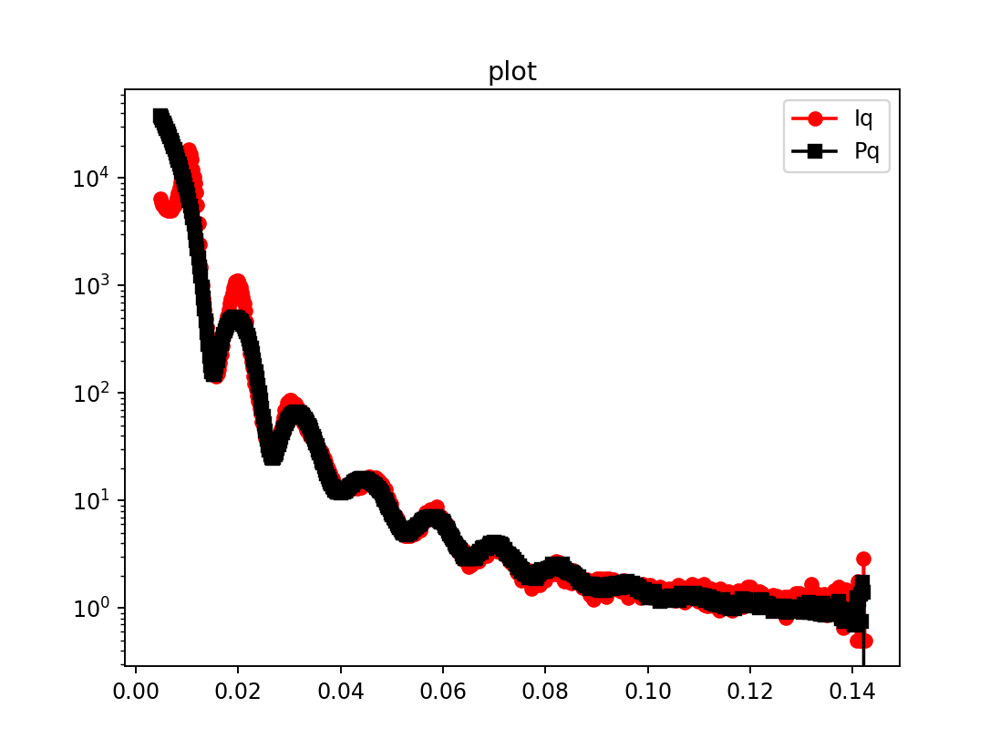

In [536]:
fig ,ax = plt.subplots()

plot1D( x = q, y = 12*iq + .5 , logy=True, ax=ax, c='r', m = 'o', legend= 'Iq')
plot1D( x = q, y = pq, logy=True, ax=ax, c='k', m = 's', legend='Pq')

In [537]:
setup_pargs['uid']

'sid=78458'

The file: SQ_sid=78458.csv is saved in /home/yuzhang/Data/Fang_CMS/July14/OneD/


/home/yuzhang/mc/envs/chx_debug/lib/python3.5/site-packages/ipykernel_launcher.py:1: RuntimeWarning: divide by zero encountered in true_divide
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


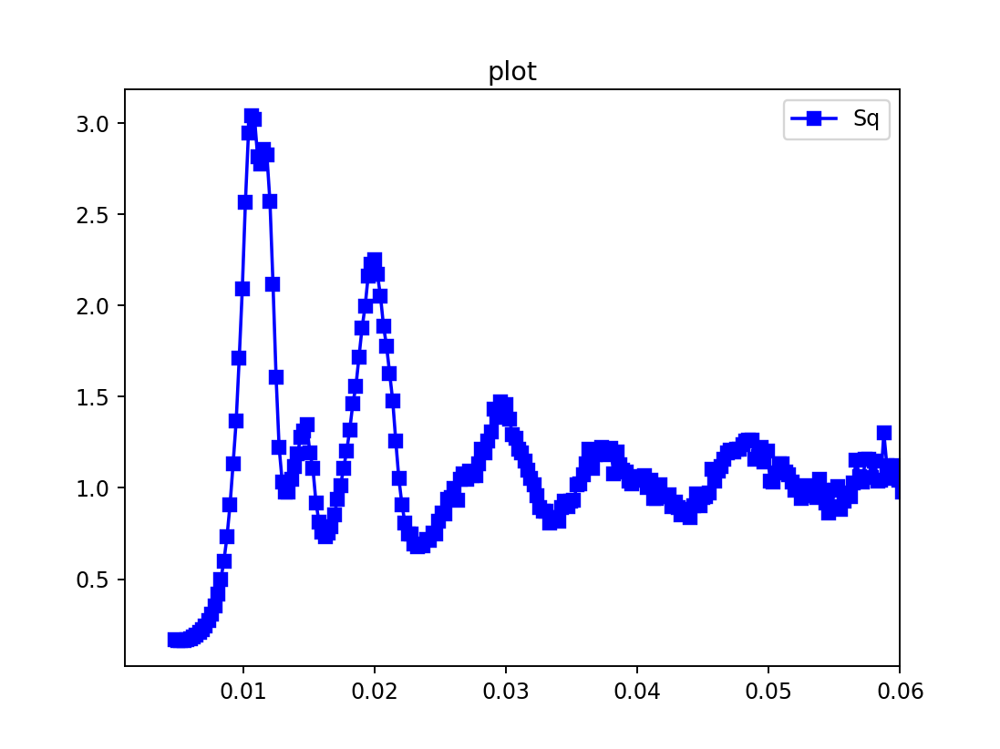

In [538]:
Sq = (12*iq + .5)/pq
save_arrays( [q,Sq], label=['q','Sq'], dtype='list', filename= 'SQ_' + setup_pargs['uid'] + '.csv', 
            path= data_dir, return_res=False)

fig ,ax = plt.subplots()
plot1D( x = q, y = Sq, logy= False, xlim=[0.001, 0.06], ax=ax, c='b', m = 's', legend='Sq')

In [485]:
p_bcc = np.array([ 1.        ,  1.41422014,  1.73207467,  2.        ,  2.23606737,
        2.4495245 ,  2.6457341 ,  2.8283913 ,  2.99996326,  3.1622773 ,
        3.31667885,  3.46414934,  3.60549324,  3.8729722 ,  4.12311266,
        4.24266043,  4.35885116,  4.69037224,  4.89890202,  5.        ,
        5.19633425,  5.74474073,  5.83089338,  6.55770621,  7.34857349])



<IPython.core.display.Javascript object>


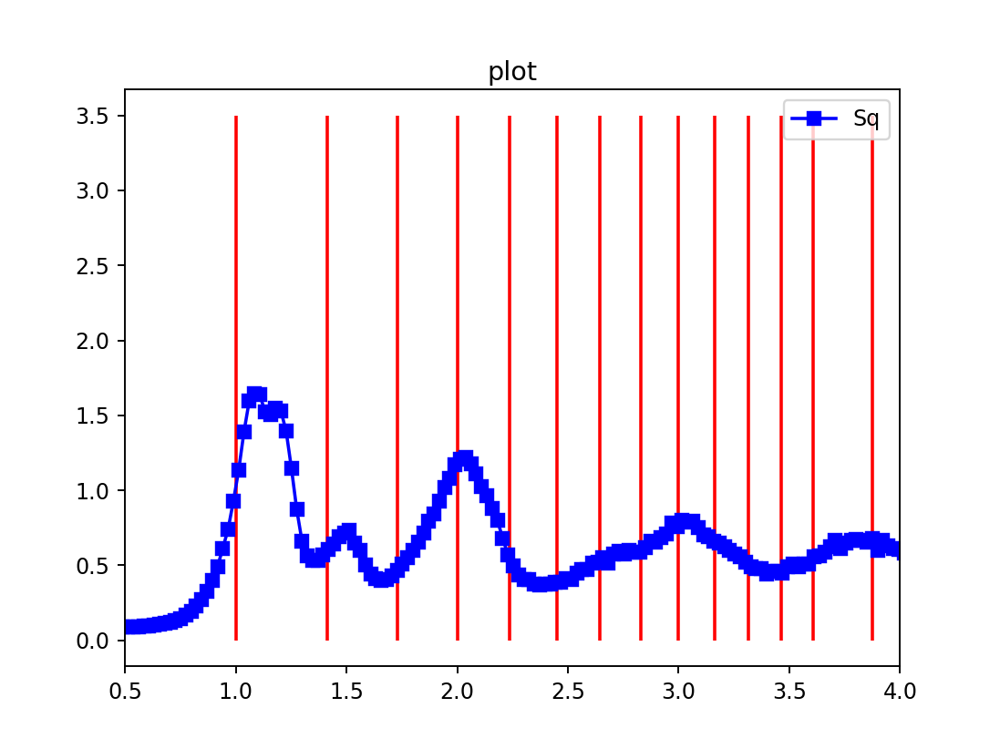

/home/yuzhang/mc/envs/chx_debug/lib/python3.5/site-packages/ipykernel_launcher.py:2: RuntimeWarning: divide by zero encountered in true_divide
  


In [539]:
fig ,ax = plt.subplots()
plot1D( x = q/0.0098, y = (6.5*iq + .5)/pq, logy= False, xlim=[.5, 4], ax=ax, c='b', m = 's', legend='Sq')
ax.vlines( p_bcc,  ymin=0, ymax=3.5, colors='r', linestyles='solid', label='BCC')

# Save 2D Diffraction Patterns
*  Please see the Save_Image_Data pipeline

In [29]:
if False:
    for i, fp in enumerate(tifs):    
        im = Image.open( inDir + fp)
        img = np.array(im )[::-1]
        print ('The current processing data is: %s --> %s'%(i,fp) )
        try:
            show_img( img[:400], logs=True, aspect= 1, cmap= cmap_albula, 
             image_name= fp[:-5], save=True,path=outDir)
        except:
            print('Something is wrong with data: %s --> %s'%(i,fp) )

cd /home/yuzhang/Data/Fang_CMS/

fp = 'FL_March03_2017_216_3_5.00s_3888_saxs.tiff'


im = Image.open(fp)

img = np.array(im )

img = img[::-1]

show_img??

fp[:-5]

show_img( img[:400], logs=True, aspect= 1, cmap= cmap_albula, 
         image_name= fp[:-5], save=True,path=outDir)

In [ ]:
#ls